In [2]:
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png'
matplotlib.rcParams['figure.figsize'] = (12.0, 4.0)
matplotlib.rcParams['font.size'] = 7

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
import logging
import importlib
importlib.reload(logging) # see https://stackoverflow.com/a/21475297/1469195
log = logging.getLogger()
log.setLevel('DEBUG')
import sys
logging.basicConfig(format='%(asctime)s %(levelname)s : %(message)s',
                     level=logging.DEBUG, stream=sys.stdout)
seaborn.set_palette('colorblind')
import os

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np

from reversible.plot import create_bw_image, create_rgb_image
from PIL import Image
import numpy as np
import itertools

In [4]:
# Your celeba 64x64 images
image_folder = '/data/schirrmr/schirrmr/celeba/CELEB_64/'
# Previously trained model
load_folder = '/data//schirrmr/schirrmr/reversible-icml/models/Continue_More_Examples_Only_Clamp/388//'

In [5]:
log.setLevel('WARNING')
images = []

for i_image in range(150000, 152000):
    images.append(np.array(Image.open(os.path.join(image_folder, 'celeb_{:d}.png'.format(
        i_image)))))
    if i_image % 1000 == 0:
        print("Loaded {:d}...".format(i_image))


Loaded 150000...
Loaded 151000...


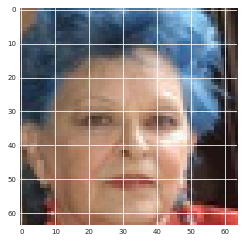

In [6]:
log.setLevel('INFO')
x = np.array(images).astype(np.float32).transpose(0,3,1,2) /255.0
plt.imshow(x.transpose(0,2,3,1)[0], interpolation='nearest')

In [7]:
from reversible.models import create_celebA_model
feature_model = create_celebA_model()

feature_model = feature_model.cuda()

import torch as th
means_per_cluster = th.load(load_folder + '/means.pkl')

stds_per_cluster = th.load(load_folder + '/stds.pkl')
feature_model.load_state_dict(th.load(load_folder + '/model_dict.pkl'))

In [8]:
from reversible.util import np_to_var, var_to_np, set_random_seeds
inputs = np_to_var(x, dtype=np.float32)
# we put all faces into one class 
targets = np_to_var(np.ones((len(x), 1)), dtype=np.float32)
del x

### Samples

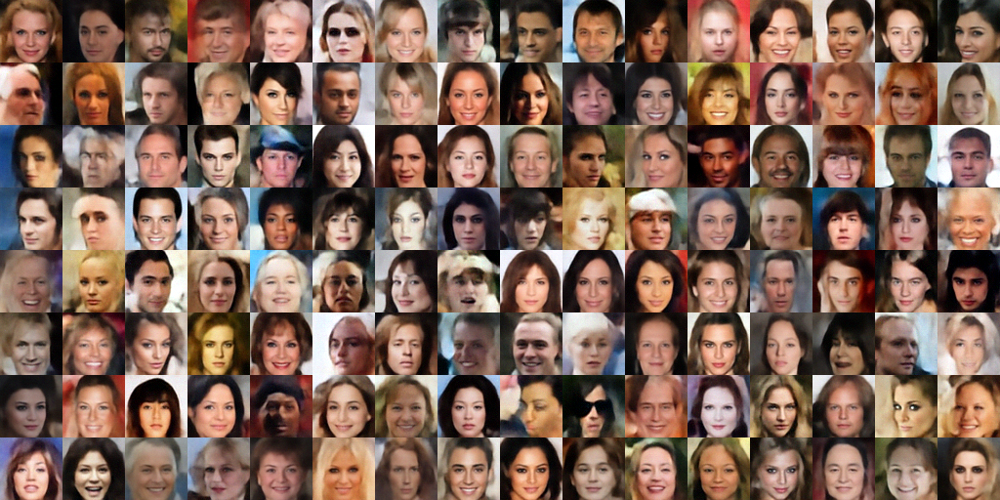

In [9]:
from reversible.gaussian import get_gauss_samples
from reversible.revnet import invert
set_random_seeds(20180727, True)
samples = get_gauss_samples(16*8, means_per_cluster[0], stds_per_cluster[0],)

inverted = var_to_np(invert(feature_model, samples)).astype(np.float64)

inverted = inverted.reshape(8,16,3,64,64)
im = create_rgb_image(inverted).resize((16*64,8*64))
display(im)

## Reconstructions

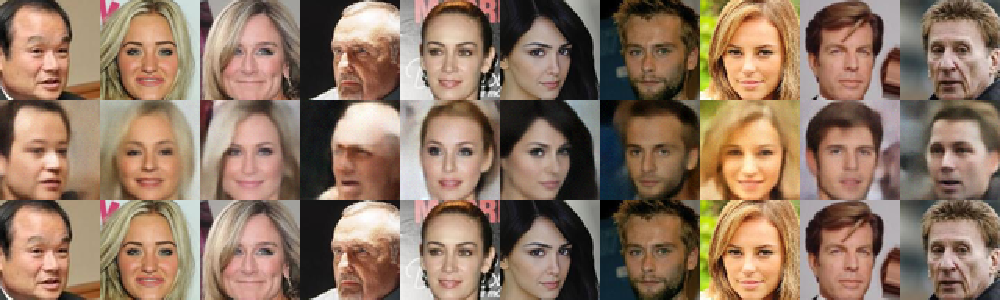

In [10]:
set_random_seeds(20180727, True)

inds = th.randperm(len(inputs))[:10]

this_ins = inputs[inds]

this_ins = this_ins.cuda()

outs = feature_model(this_ins)


i_class = 0
mean = means_per_cluster[i_class]
std = stds_per_cluster[i_class] * stds_per_cluster[i_class]
min_vals = (mean - 20 * std).unsqueeze(0)
max_vals = (mean + 20 * std).unsqueeze(0)
outs_clamped = th.min(th.max(outs,min_vals.detach()), max_vals.detach())
inverted_clamped = invert(feature_model, outs_clamped)



rows = 3
cols = len(this_ins)
inverted= invert(feature_model, outs)
image_cells = np.zeros((rows, cols, 3, 64,64))
for i_example in range(len(this_ins)):
    image_cells[0, i_example] = var_to_np(this_ins[i_example]).squeeze()
    image_cells[1, i_example] = var_to_np(inverted_clamped[i_example]).squeeze()
    image_cells[2, i_example] = var_to_np(inverted[i_example]).squeeze()
im = create_rgb_image(image_cells).resize((10*100,3*100))
display(im)

## Interpolations

/home/schirrmr/anaconda3/envs/default/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.


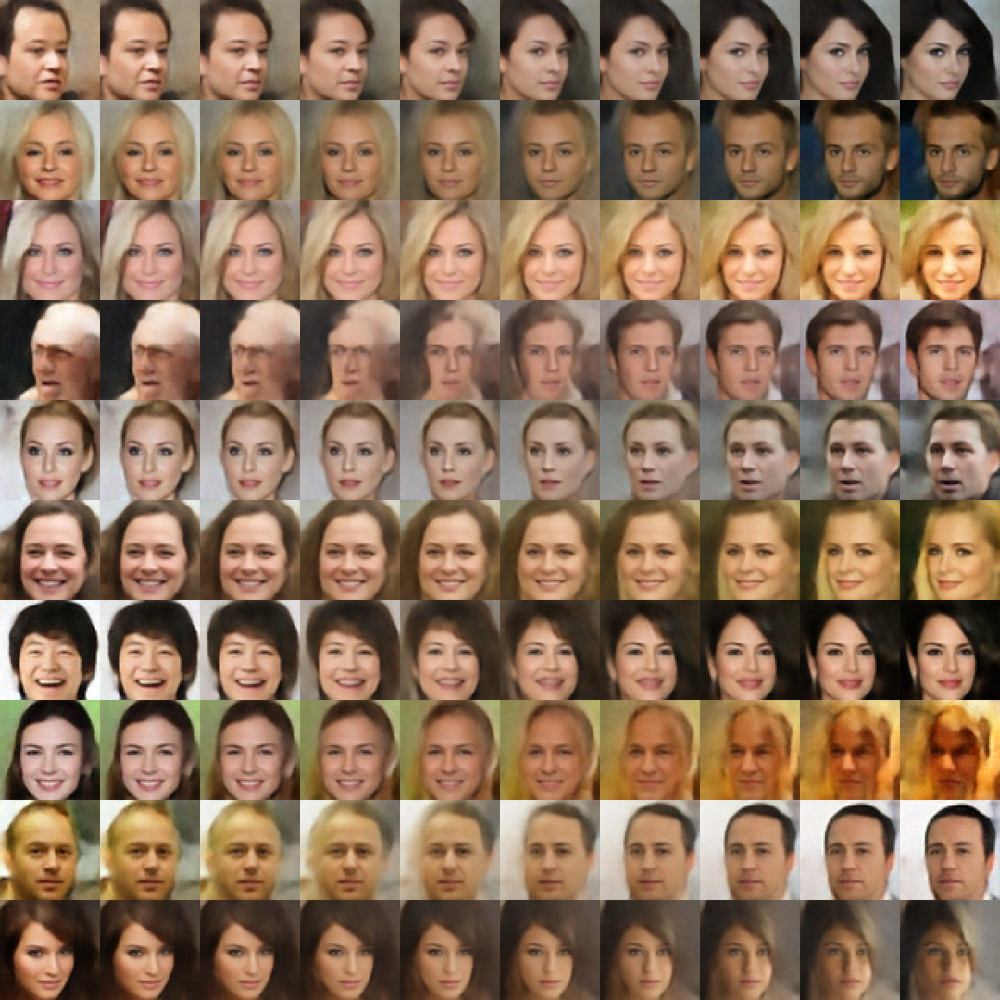

In [11]:
from reversible.util import set_random_seeds
from reversible.revnet import invert
i_class = 0
set_random_seeds(20180727, True)
inds = th.randperm(len(inputs))[:10]
inds_a = th.cat((inds[:5],th.randperm(len(inputs))[:5]))

a = inputs[inds_a]

a = a.cuda()

outs_a = feature_model(a)
inds_b = th.cat((inds[5:],th.randperm(len(inputs))[:5]))

b = inputs[inds_b]

b = b.cuda()

outs_b = feature_model(b)

mean = means_per_cluster[i_class]
std = stds_per_cluster[i_class] * stds_per_cluster[i_class]
min_vals = (mean - 20 * std).unsqueeze(0)
max_vals = (mean + 20 * std).unsqueeze(0)
clamped_a = th.min(th.max(outs_a,min_vals.detach()), max_vals.detach())
clamped_b = th.min(th.max(outs_b,min_vals.detach()), max_vals.detach())

interp_vals = th.autograd.Variable(th.linspace(0,1,10).cuda(), volatile=True)

interps = clamped_a.unsqueeze(0) * (1 - interp_vals.unsqueeze(1).unsqueeze(2)) + (
    clamped_b.unsqueeze(0) * (interp_vals.unsqueeze(1).unsqueeze(2)))
interps = interps.view(-1, interps.size()[2]).contiguous()
inverted_interps = invert(feature_model, interps)

inverted_interps = inverted_interps.view(len(interp_vals), len(clamped_a), *inverted_interps.size()[1:])


rows = inverted_interps.size()[1]
cols = inverted_interps.size()[0]
image_cells = np.zeros((rows, cols, 3, 64,64))
for i_row, i_col in itertools.product(range(rows), range(cols)):
    i_example = (i_row * cols + i_col)
    image_cells[i_row, i_col] = var_to_np(inverted_interps[i_col, i_row]).squeeze()
im = create_rgb_image(image_cells).resize((12*100,12*100))
display(im)

### in unrestricted latent space

/home/schirrmr/anaconda3/envs/default/lib/python3.6/site-packages/ipykernel_launcher.py:21: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.


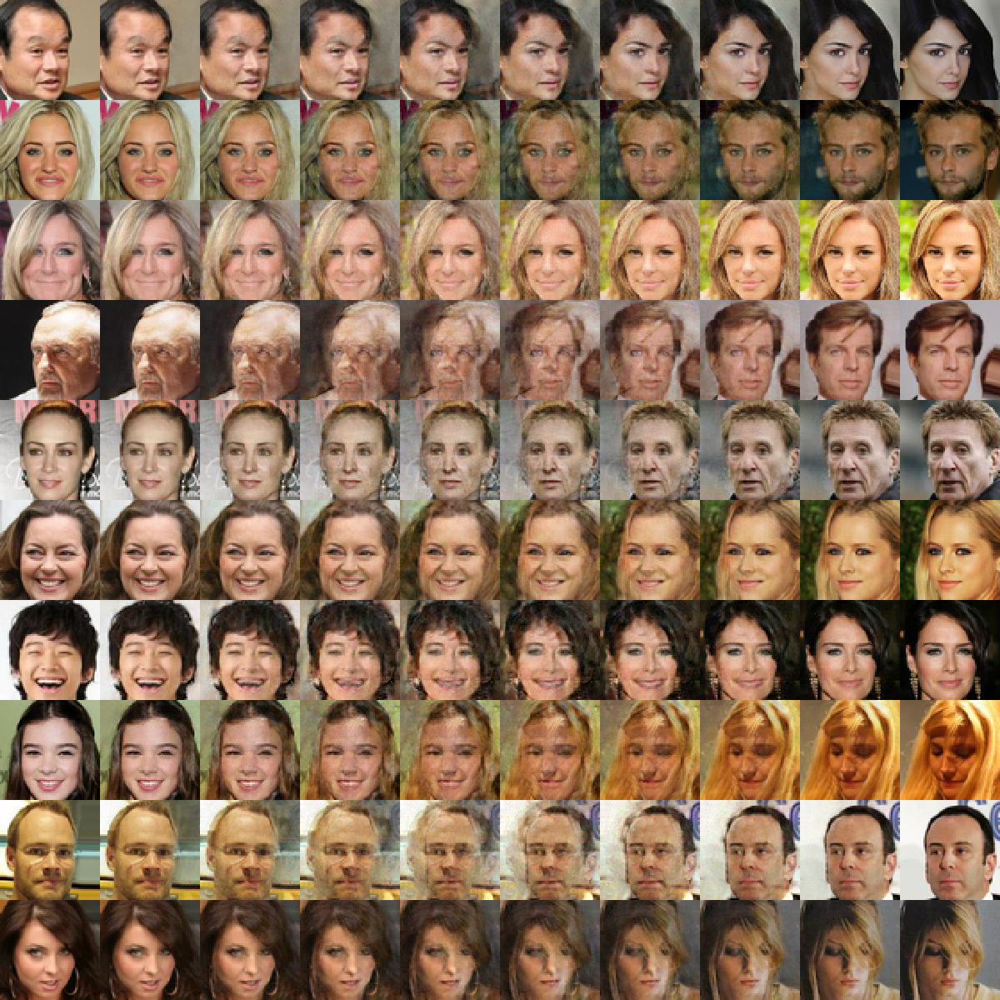

In [12]:
from reversible.util import set_random_seeds
from reversible.revnet import invert
i_class = 0
set_random_seeds(20180727, True)
inds = th.randperm(len(inputs))[:10]
inds_a = th.cat((inds[:5],th.randperm(len(inputs))[:5]))

a = inputs[inds_a]

a = a.cuda()

outs_a = feature_model(a)
inds_b = th.cat((inds[5:],th.randperm(len(inputs))[:5]))

b = inputs[inds_b]

b = b.cuda()

outs_b = feature_model(b)

interp_vals = th.autograd.Variable(th.linspace(0,1,10).cuda(), volatile=True)


interps = outs_a.unsqueeze(0) * (1 - interp_vals.unsqueeze(1).unsqueeze(2)) + (
    outs_b.unsqueeze(0) * (interp_vals.unsqueeze(1).unsqueeze(2)))
interps = interps.view(-1, interps.size()[2]).contiguous()
inverted_interps = invert(feature_model, interps)

inverted_interps = inverted_interps.view(len(interp_vals), len(clamped_a), *inverted_interps.size()[1:])


rows = inverted_interps.size()[1]
cols = inverted_interps.size()[0]
image_cells = np.zeros((rows, cols, 3, 64,64))
for i_row, i_col in itertools.product(range(rows), range(cols)):
    i_example = (i_row * cols + i_col)
    image_cells[i_row, i_col] = var_to_np(inverted_interps[i_col, i_row]).squeeze()
im = create_rgb_image(image_cells).resize((12*100,12*100))
display(im)

### Varying latent dimensions

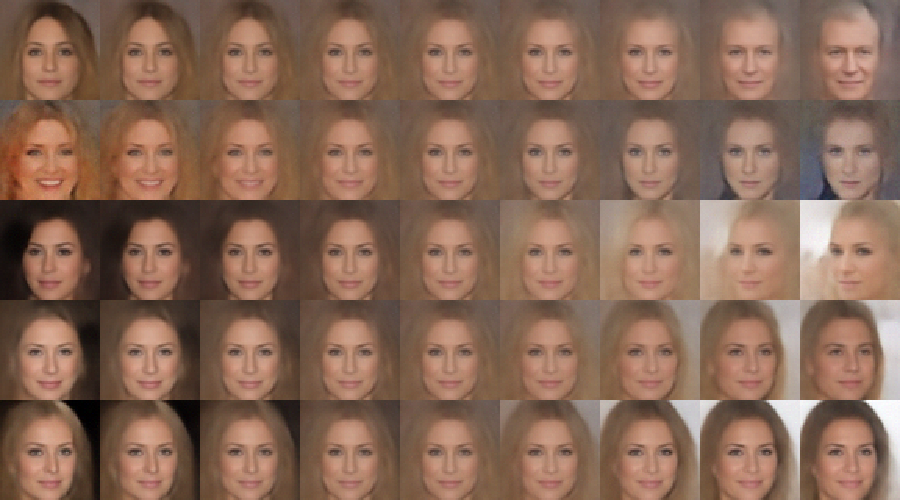

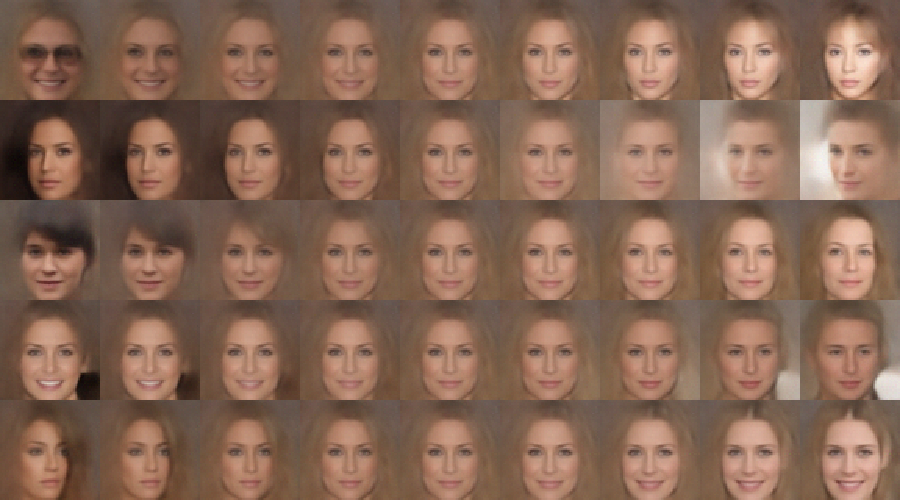

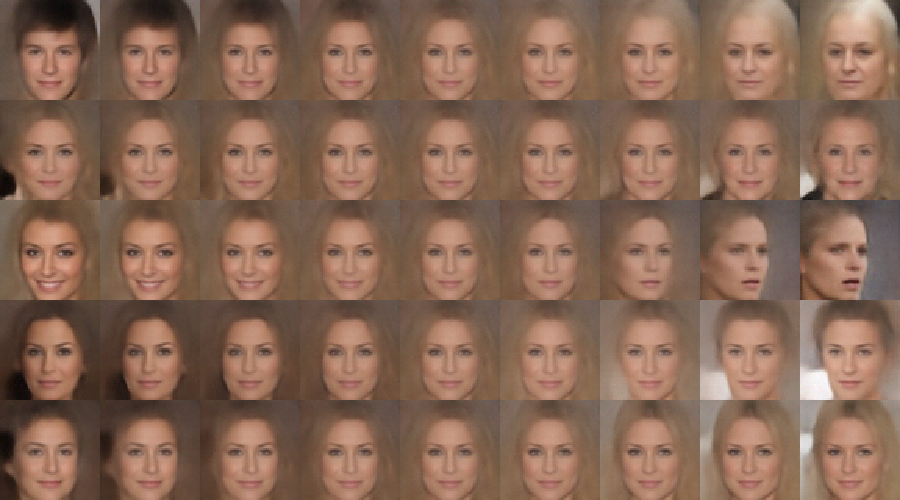

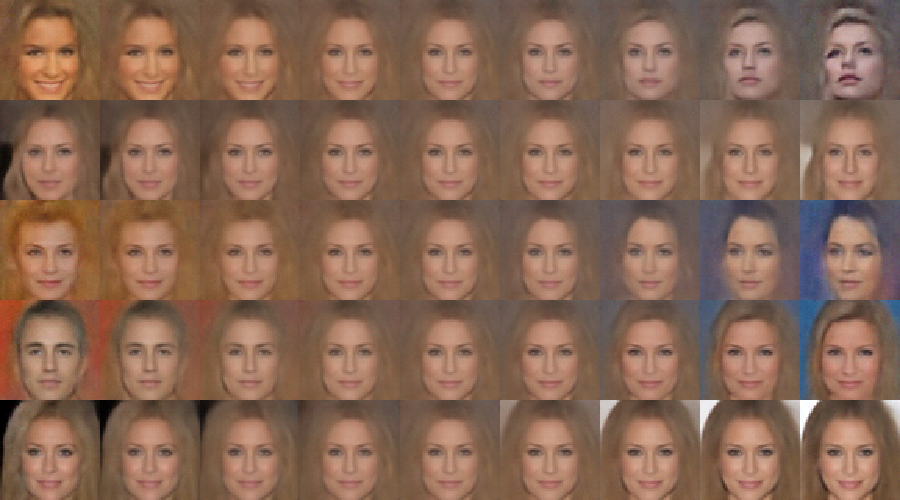

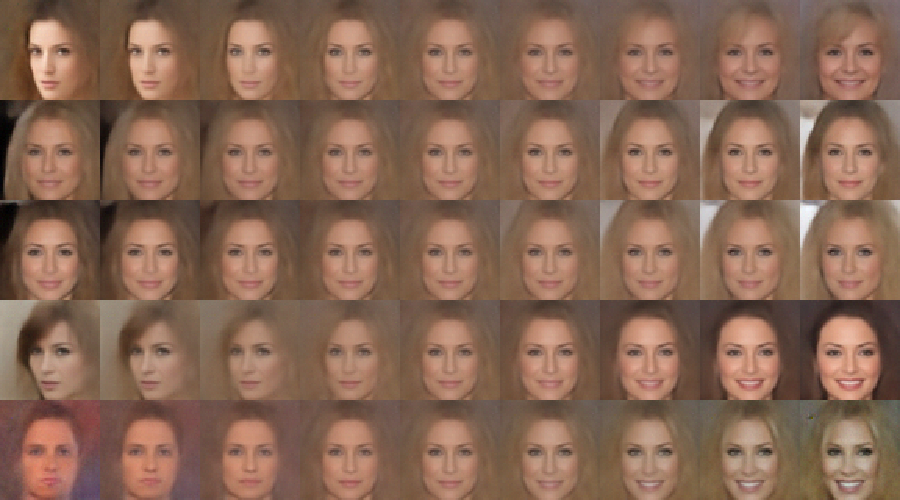

...

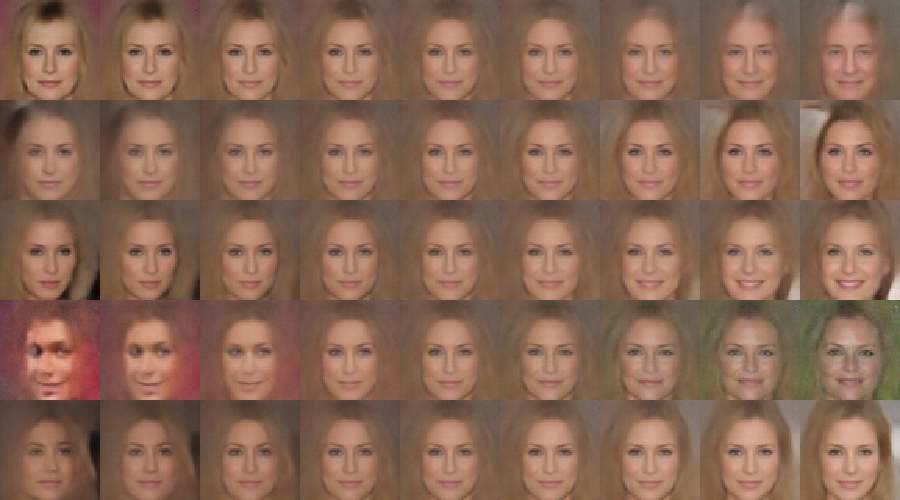

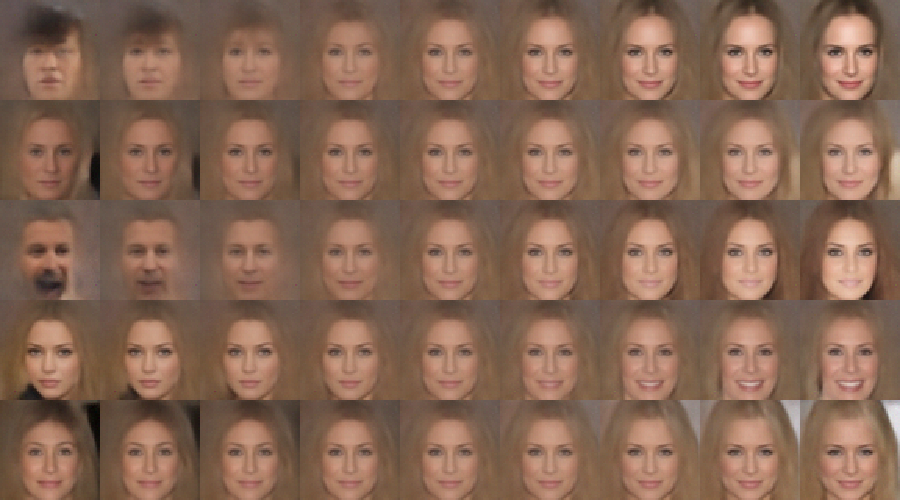

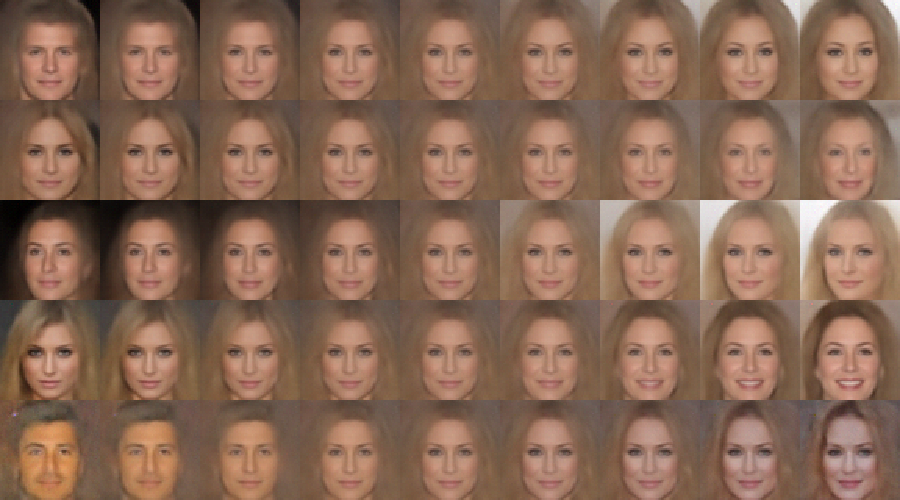

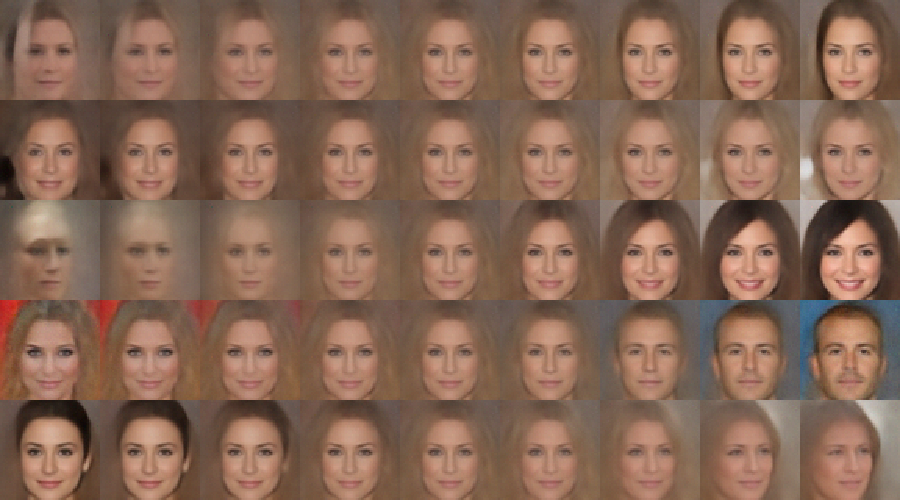

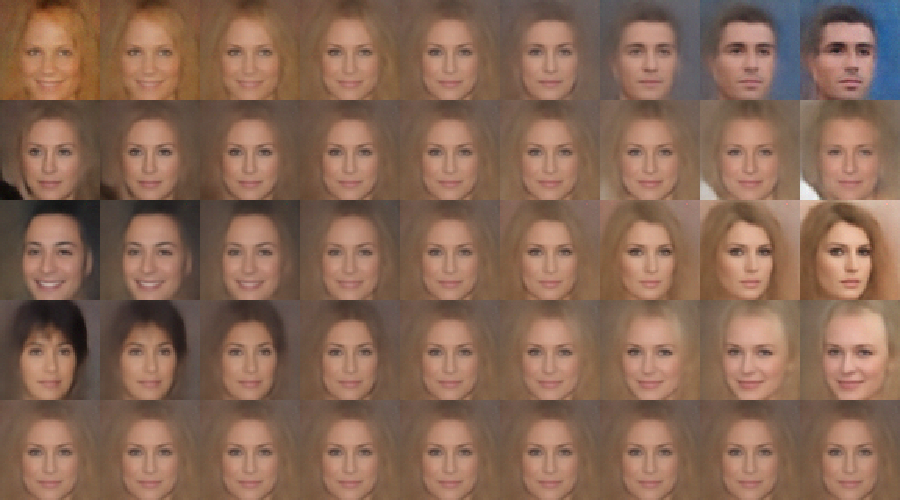

In [13]:
for i_start in range(0,61,5):
    i_stds = np.argsort(var_to_np(stds_per_cluster[0]))[::-1][i_start:i_start+5]


    image_grid = np.zeros((len(i_stds), 9, 3, 64,64))


    mean = means_per_cluster[0]
    std = stds_per_cluster[0] * stds_per_cluster[0]

    for i_i_std, i_feature_a in enumerate(i_stds):
        feature_a_values = th.linspace(float(mean[i_feature_a].data - 4 * std[i_feature_a].data),
                                       float(mean[i_feature_a].data + 4 * std[i_feature_a].data), 9)

        for i_f_a_val, f_a_val in enumerate(feature_a_values):
            this_out = mean.clone()
            this_out.data[i_feature_a] = f_a_val
            inverted = var_to_np(invert(feature_model, this_out.unsqueeze(0))[0]).squeeze()
            image_grid[i_i_std, i_f_a_val] = np.copy(inverted)
    im = create_rgb_image(image_grid).resize((9*100,5*100))
    display(im)